# Dimensionality reduction for Google's hair dryer seed

In [1]:
#TODO: remove after development 
%load_ext autoreload
%autoreload 2

In [2]:
%matplotlib inline

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pickle


from fiz_lernmodule import data_reader
from fiz_lernmodule.visualization_landscaping import EmbeddingVisualizer

## Preprocessing data

In [4]:
landscape_reader = data_reader.LandscapeDataReader(src_dir="C:/Users/tskripnikova/Google Drive/FIZ_doc_embeddings/notebook_data")
patents = landscape_reader.load_data(seed_name='hair_dryer_large')

Loading data from C:/Users/tskripnikova/Google Drive/FIZ_doc_embeddings/notebook_data\data\hair_dryer_large\landscape_data.pkl
Finished loading.


In [5]:
print(patents.shape)
patents.head()

(10281, 11)


,pub_num,publication_number,family_id,priority_date,title_text,abstract_text,claims_text,description_text,refs,cpcs,ExpansionLevel
0,2008100685,US-2008100685-A1,39329596,20061027,Thermal ejection of solution having solute ont...,A solution is provided that includes a non-aqu...,unused,unused,"US-369445-A,US-369445-A,US-369445-A,US-3005950...","B05D1/26,B41J11/002,B41J3/4073,B05D1/26,B41J11...",AntiSeed
1,8771298,US-8771298-B2,43085563,20090513,Treatment of sphincter dysfunction,A dysfunctional sphincter muscle may be treate...,unused,unused,"US-6254642-B1,US-6254642-B1,US-6254642-B1,US-6...","A61B17/00234,A61B17/0469,A61F2/0036,A61B2017/0...",AntiSeed
2,2004120209,US-2004120209-A1,32588826,20021218,Semiconductor memory device supporting two dat...,A layout of a memory cell of a dual-port semic...,unused,unused,"US-5754468-A,US-6341083-B1,US-6347062-B2,US-65...","G11C8/16,G11C8/16,G11C8/16,G11C8/16",AntiSeed
3,2003153946,US-2003153946-A1,20280670,20000811,Device and method for treatment of atrioventri...,A device for treatment of atrioventricular reg...,unused,unused,"US-3805793-A,US-3805793-A,US-3805793-A,US-3805...","A61B2017/00243,A61B17/064,A61B17/0644,A61B2017...",AntiSeed
4,7183453,US-7183453-B2,30769611,20020723,Method for treating infectious waste matter,A system and method is provided for producing ...,unused,unused,"US-4144152-A,US-4144152-A,US-5763736-A,US-5763...","A61L11/00,B09B3/0075,A61L11/00,B09B3/0075,A61L...",AntiSeed


In [6]:
final_layer_train = pd.read_csv('C:/Users/tskripnikova/Google Drive/FIZ_doc_embeddings/doc_embeddings/hair_dryer_large/train_final_layer_per_doc.csv')
final_layer_test = pd.read_csv('C:/Users/tskripnikova/Google Drive/FIZ_doc_embeddings/doc_embeddings/hair_dryer_large/test_final_layer_per_doc.csv')

final_layer = pd.concat([final_layer_train, final_layer_test])
final_layer.set_index("Unnamed: 0", inplace=True)
print(final_layer.shape)
final_layer.head()

(10281, 64)


,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
8437,-0.470769,-0.077550,0.801913,-0.252584,-0.246207,0.017284,-0.266955,0.004011,0.044459,0.203775,...,-0.024954,-0.084339,0.379040,-0.278768,0.594196,0.257444,-0.424474,-0.117506,0.076143,-0.229693
9669,-0.477028,-0.171554,0.311944,-0.213595,-0.454909,0.244344,-0.274349,-0.263851,0.824203,-0.123213,...,-0.070671,-0.131323,0.963014,-0.075588,1.233004,-0.087883,-0.161040,-0.053010,0.192010,-0.271010
2008,-0.345737,-0.223970,0.117984,-0.251780,-0.233198,-0.091821,-0.243135,-0.291292,0.478406,-0.149845,...,-0.366041,-0.047510,0.622095,-0.101608,1.047526,-0.122393,-0.471420,-0.065817,0.141569,-0.100915
8467,-0.597455,0.144149,0.558878,-0.041867,-0.296718,-0.006206,-0.241646,-0.238618,0.262134,0.109712,...,0.003800,-0.193948,0.632793,-0.247355,1.112453,0.107004,-0.266507,-0.271605,0.214769,-0.213229
4688,-0.526999,0.024130,0.391008,-0.146115,-0.242134,0.006295,-0.352944,-0.075770,0.392557,-0.155257,...,-0.338419,-0.141194,0.950295,-0.145374,1.046570,-0.036414,-0.345356,-0.044848,0.025176,-0.011135


In [7]:
average_word_train = pd.read_csv('C:/Users/tskripnikova/Google Drive/FIZ_doc_embeddings/doc_embeddings/hair_dryer_large/train_average_word_embedding_per_doc.csv')
average_word_test = pd.read_csv('C:/Users/tskripnikova/Google Drive/FIZ_doc_embeddings/doc_embeddings/hair_dryer_large/test_average_word_embedding_per_doc.csv')

average_word = pd.concat([average_word_train, average_word_test])
average_word.set_index("Unnamed: 0", inplace=True)
print(average_word.shape)
average_word.head()

(10281, 300)


,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
8437,-0.068656,-0.093737,0.109078,-0.047961,-0.114728,0.013998,0.044748,0.015971,0.057588,0.090531,...,0.154273,-0.097059,0.136817,-0.050672,-0.030005,0.018842,0.026166,0.147578,-0.056190,-0.103365
9669,-0.068497,-0.114902,0.124965,-0.050111,-0.122915,0.008892,0.050232,0.006334,0.063107,0.110592,...,0.147326,-0.103536,0.122000,-0.051844,-0.030882,0.017879,0.031449,0.176259,-0.054747,-0.105623
2008,-0.056118,-0.090630,0.090511,-0.040690,-0.083683,0.006885,0.028473,-0.002398,0.062240,0.087504,...,0.129875,-0.069607,0.186482,-0.027624,-0.025458,0.025460,0.029641,0.128869,-0.036249,-0.092073
8467,-0.051087,-0.094070,0.115360,-0.040989,-0.109216,0.003612,0.048338,0.000402,0.035963,0.103174,...,0.127561,-0.077572,0.135231,-0.038544,-0.029366,0.023703,0.029943,0.138820,-0.055726,-0.088031
4688,-0.060799,-0.111060,0.126108,-0.041362,-0.113763,-0.000938,0.038291,0.010825,0.058351,0.101950,...,0.143842,-0.092829,0.167917,-0.050920,-0.033606,0.018226,0.020865,0.161574,-0.052178,-0.104728


In [8]:
from sklearn.manifold import TSNE

params = {}
tsne = TSNE(**params)

## Whole data set (seed and anti-seed)

In [9]:
ev64 = EmbeddingVisualizer(tsne, final_layer, patents)

Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='euclidean', min_grad_norm=1e-07,
   n_components=2, n_iter=1000, n_iter_without_progress=300,
   perplexity=30.0, random_state=None, verbose=0)
EmbeddingVisualizer initialized


### Final layer

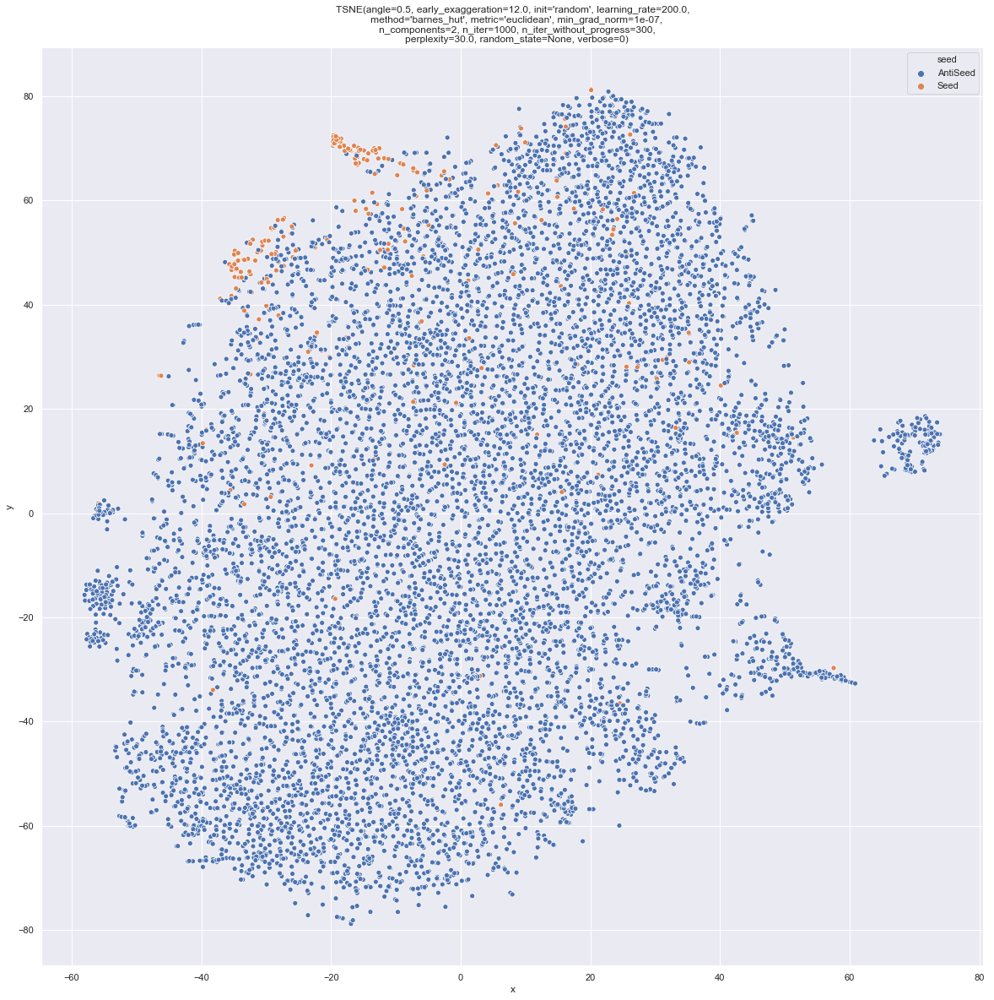

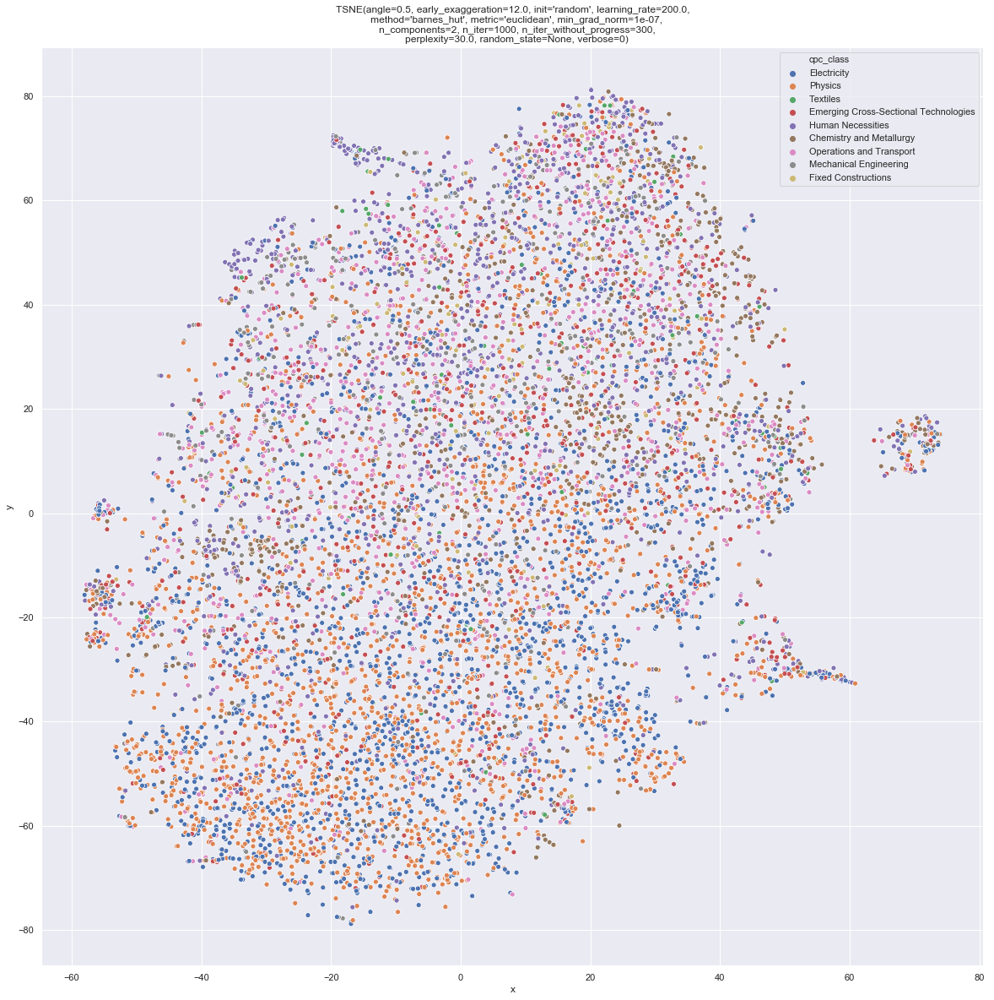

In [10]:
ev64.plot_embeddings(detailed=False, label=False)
ev64.plot_embeddings(detailed=True, label=False)

In [11]:
ev300 = EmbeddingVisualizer(tsne, average_word, patents)

Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='euclidean', min_grad_norm=1e-07,
   n_components=2, n_iter=1000, n_iter_without_progress=300,
   perplexity=30.0, random_state=None, verbose=0)
EmbeddingVisualizer initialized


### Averaged words

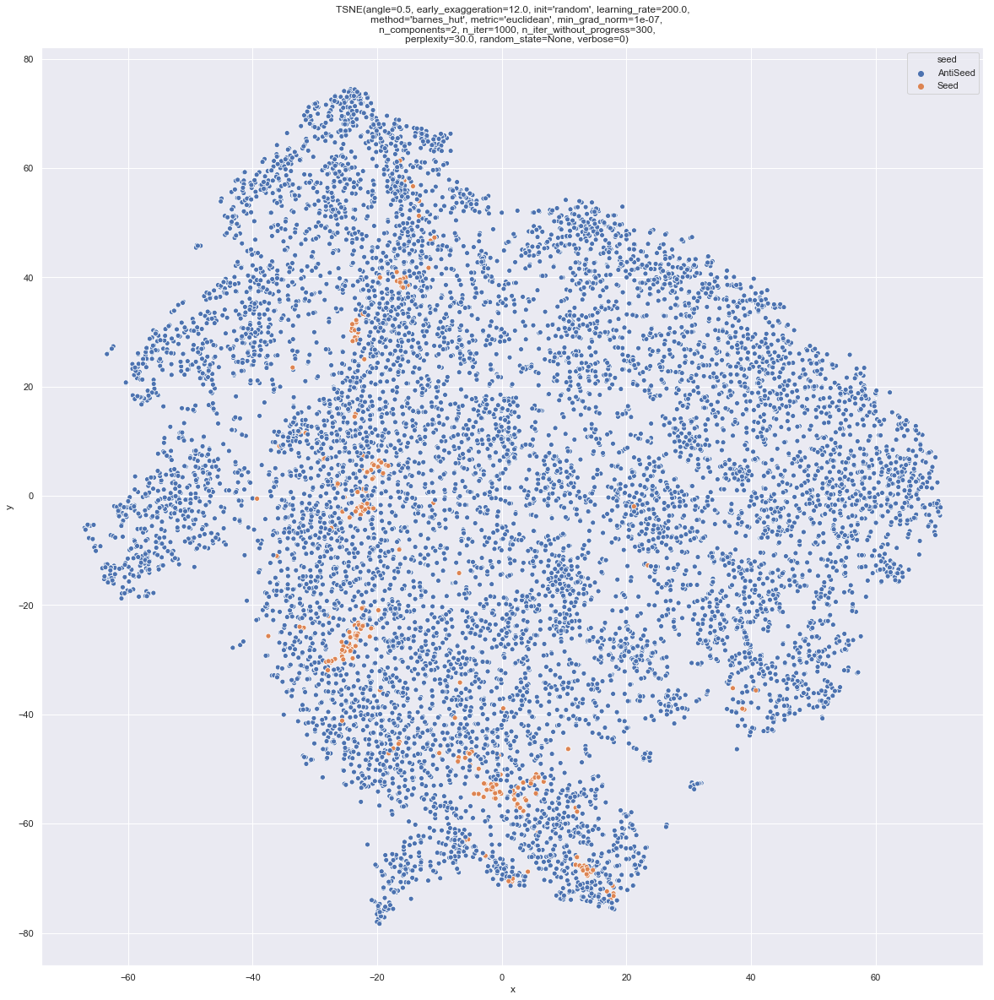

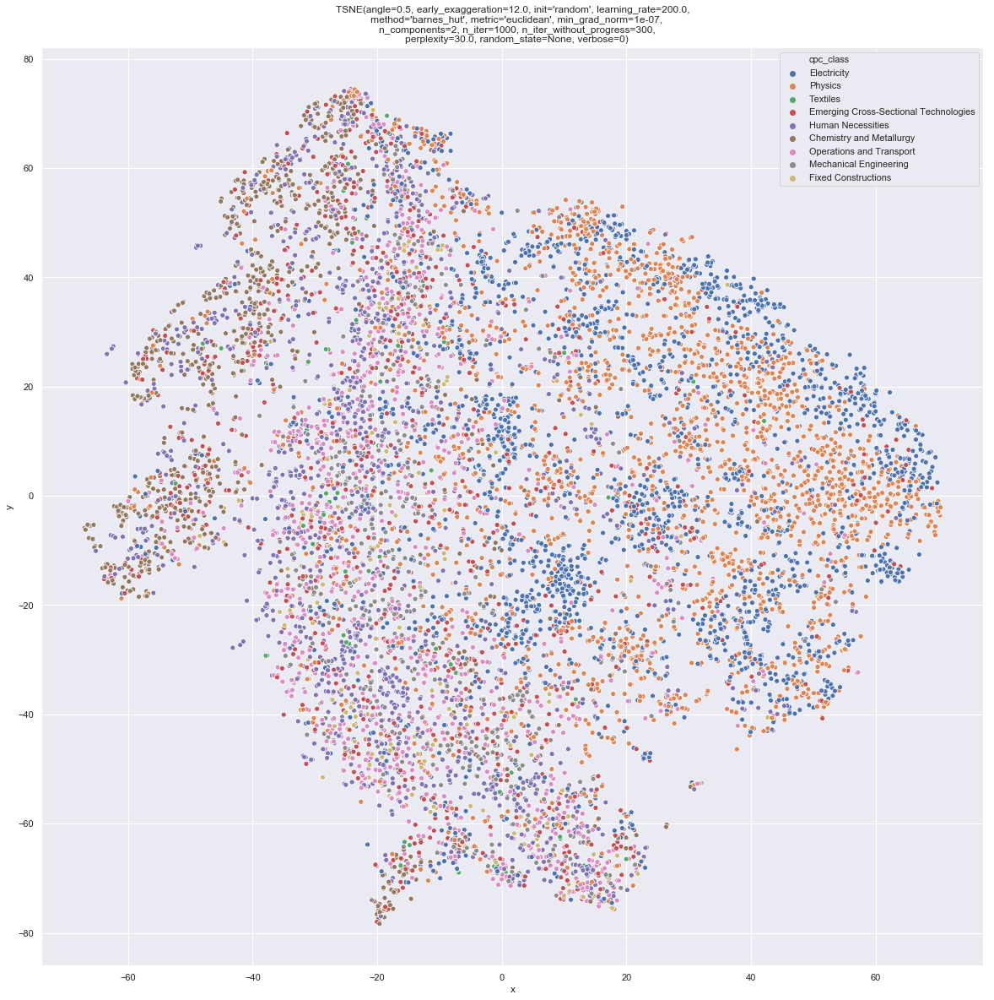

In [12]:
ev300.plot_embeddings(detailed=False, label=False)
ev300.plot_embeddings(detailed=True, label=False)

## Seed only

In [13]:
### Preprocessing of text from abstract to labels with TF-IDF

In [14]:
patents_seed = patents.loc[patents['ExpansionLevel'] == 'Seed']
patents_seed["abstract_prep"] = patents_seed["title_text"].str.cat(patents_seed["abstract_text"], sep=" ")
print(patents_seed.shape)
patents_seed.head()

(265, 12)


C:\Users\tskripnikova\Anaconda3\envs\vis_emb\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,pub_num,publication_number,family_id,priority_date,title_text,abstract_text,claims_text,description_text,refs,cpcs,ExpansionLevel,abstract_prep
46,5651190,US-5651190-A,24447974,19960305,Hands-free hair dryer,A portable apparatus for drying the hair of a ...,unused,unused,"US-2466915-A,US-2900739-A,US-3377715-A,US-3386...","A45D20/18,A45D20/18,A45D20/18,A45D20/18,A45D20...",Seed,Hands-free hair dryer A portable apparatus for...
54,5155925,US-5155925-A,19322818,19911121,Portable LPG-powered hair dryer,In order to make a hair dryer available outdoo...,unused,unused,"US-4555232-A,US-4555232-A,US-4635382-A,US-4635...","A45D20/06,A45D2020/065,A45D20/06,A45D2020/065,...",Seed,Portable LPG-powered hair dryer In order to ma...
168,5149209,US-5149209-A,24662582,19910304,Hair dryer with audible unplug alarm,A hair dryer that includes a case having a han...,unused,unused,"US-3505664-A,US-3505664-A,US-3505664-A,US-3815...","G08B21/24,F24H9/2071,A45D20/12,G08B21/24,F24H9...",Seed,Hair dryer with audible unplug alarm A hair dr...
214,6199295,US-6199295-B1,23805909,19991206,Variable-configuration hair dryer and nozzle,A detachable or integral nozzle for a hair dry...,unused,unused,"US-2317798-A,US-2439444-A,US-4097722-A,US-4218...","A45D20/122,A45D20/122,A45D20/122,A45D20/122,A4...",Seed,Variable-configuration hair dryer and nozzle A...
215,4711988,US-4711988-A,25125892,19851001,Electric hair dryer with multi-mode switch for...,A hair dryer including a blower for selectivel...,unused,unused,"US-1454151-A,US-1454151-A,US-1454151-A,US-1528...","A45D20/10,A45D20/30,F24H3/0423,A45D20/10,A45D2...",Seed,Electric hair dryer with multi-mode switch for...


In [15]:
from fiz_lernmodule.preprocessing import PreProcessor

pre = PreProcessor()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\tskripnikova\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [16]:
patents_seed['label'] = patents_seed['abstract_text'].map(lambda patent: pre.preprocess_text(patent).split())
print(patents_seed.shape)
patents_seed.head()

(265, 13)


C:\Users\tskripnikova\Anaconda3\envs\vis_emb\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,pub_num,publication_number,family_id,priority_date,title_text,abstract_text,claims_text,description_text,refs,cpcs,ExpansionLevel,abstract_prep,label
46,5651190,US-5651190-A,24447974,19960305,Hands-free hair dryer,A portable apparatus for drying the hair of a ...,unused,unused,"US-2466915-A,US-2900739-A,US-3377715-A,US-3386...","A45D20/18,A45D20/18,A45D20/18,A45D20/18,A45D20...",Seed,Hands-free hair dryer A portable apparatus for...,"[portabl, apparatu, dri, hair, wearer, hair, d..."
54,5155925,US-5155925-A,19322818,19911121,Portable LPG-powered hair dryer,In order to make a hair dryer available outdoo...,unused,unused,"US-4555232-A,US-4555232-A,US-4635382-A,US-4635...","A45D20/06,A45D2020/065,A45D20/06,A45D2020/065,...",Seed,Portable LPG-powered hair dryer In order to ma...,"[order, make, hair, dryer, avail, outdoor, gen..."
168,5149209,US-5149209-A,24662582,19910304,Hair dryer with audible unplug alarm,A hair dryer that includes a case having a han...,unused,unused,"US-3505664-A,US-3505664-A,US-3505664-A,US-3815...","G08B21/24,F24H9/2071,A45D20/12,G08B21/24,F24H9...",Seed,Hair dryer with audible unplug alarm A hair dr...,"[hair, dryer, includ, case, handl, barrel, fan..."
214,6199295,US-6199295-B1,23805909,19991206,Variable-configuration hair dryer and nozzle,A detachable or integral nozzle for a hair dry...,unused,unused,"US-2317798-A,US-2439444-A,US-4097722-A,US-4218...","A45D20/122,A45D20/122,A45D20/122,A45D20/122,A4...",Seed,Variable-configuration hair dryer and nozzle A...,"[detach, integr, nozzl, hair, dryer, shown, ea..."
215,4711988,US-4711988-A,25125892,19851001,Electric hair dryer with multi-mode switch for...,A hair dryer including a blower for selectivel...,unused,unused,"US-1454151-A,US-1454151-A,US-1454151-A,US-1528...","A45D20/10,A45D20/30,F24H3/0423,A45D20/10,A45D2...",Seed,Electric hair dryer with multi-mode switch for...,"[hair, dryer, includ, blower, select, gener, c..."


In [17]:
import gensim

dictionary = gensim.corpora.Dictionary(patents_seed['label'] )
#dictionary.token2id

C:\Users\tskripnikova\Anaconda3\envs\vis_emb\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


In [18]:
#Document to Bag-of-word
bow_corpus = [dictionary.doc2bow(doc) for doc in patents_seed['label'] ]

# Preview Bag Of Words for a sample document
bow_doc_0 = bow_corpus[0]
for i in range(len(bow_doc_0)):
    print("Word {} \"{}\" appears {} times.".format(bow_doc_0[i][0], dictionary[bow_doc_0[i][0]], bow_doc_0[i][1]))

Word 0 "air" appears 1 times.
Word 1 "apparatu" appears 2 times.
Word 2 "arrang" appears 1 times.
Word 3 "batteri" appears 1 times.
Word 4 "belt" appears 1 times.
Word 5 "blower" appears 2 times.
Word 6 "bodi" appears 1 times.
Word 7 "cap" appears 2 times.
Word 8 "case" appears 6 times.
Word 9 "commun" appears 2 times.
Word 10 "conduit" appears 4 times.
Word 11 "configur" appears 1 times.
Word 12 "cord" appears 1 times.
Word 13 "coupl" appears 1 times.
Word 14 "cut-off" appears 1 times.
Word 15 "dispos" appears 1 times.
Word 16 "dri" appears 1 times.
Word 17 "dryer" appears 4 times.
Word 18 "electr" appears 2 times.
Word 19 "extend" appears 1 times.
Word 20 "forc" appears 1 times.
Word 21 "form" appears 1 times.
Word 22 "hair" appears 6 times.
Word 23 "hole" appears 2 times.
Word 24 "includ" appears 3 times.
Word 25 "inlet" appears 1 times.
Word 26 "mean" appears 3 times.
Word 27 "member" appears 2 times.
Word 28 "mount" appears 3 times.
Word 29 "open" appears 3 times.
Word 30 "oper" a

In [19]:
#creating TfidfModel 
from pprint import pprint

tfidf = gensim.models.TfidfModel(bow_corpus)
corpus_tfidf = tfidf[bow_corpus]

for doc in corpus_tfidf:
    pprint(doc)
    break

[(0, 0.0091857587005759),
 (1, 0.17613069747615345),
 (2, 0.06730742746049227),
 (3, 0.0952875132811126),
 (4, 0.16709812248597217),
 (5, 0.12298593864932296),
 (6, 0.0558864797335452),
 (7, 0.2377994437601773),
 (8, 0.4391902770471884),
 (9, 0.18536350622582018),
 (10, 0.4051882754007434),
 (11, 0.07192383183532565),
 (12, 0.08225089060224593),
 (13, 0.07319837950786473),
 (14, 0.16709812248597217),
 (15, 0.051796404373499534),
 (16, 0.04601945075113198),
 (17, 0.010875931194674192),
 (18, 0.06881380128519823),
 (19, 0.04302221637987487),
 (20, 0.0952875132811126),
 (21, 0.04549861414352817),
 (22, 0.020065266877597642),
 (23, 0.171998390124391),
 (24, 0.055422230758478956),
 (25, 0.05054841754535019),
 (26, 0.15929600473290703),
 (27, 0.1195624525900339),
 (28, 0.1122124050415687),
 (29, 0.11832646770672667),
 (30, 0.08510118964093087),
 (31, 0.06740444919790088),
 (32, 0.053771670725943674),
 (33, 0.039023305017432494),
 (34, 0.11792139924599807),
 (35, 0.06969126731167949),
 (36, 0

In [20]:
from operator import itemgetter

for i, doc in enumerate(corpus_tfidf):
    doc.sort(key=itemgetter(1), reverse=True)
    sorted_words = []
    for word_id, relevance in doc:
        sorted_words.append(dictionary[word_id])
        #print(dictionary[word_id] + " " + str(word_id) + " " + str(relevance)) 
    patents_seed.iat[i, 12] = sorted_words # replace label with a sorted list
    
patents_seed.head()

,pub_num,publication_number,family_id,priority_date,title_text,abstract_text,claims_text,description_text,refs,cpcs,ExpansionLevel,abstract_prep,label
46,5651190,US-5651190-A,24447974,19960305,Hands-free hair dryer,A portable apparatus for drying the hair of a ...,unused,unused,"US-2466915-A,US-2900739-A,US-3377715-A,US-3386...","A45D20/18,A45D20/18,A45D20/18,A45D20/18,A45D20...",Seed,Hands-free hair dryer A portable apparatus for...,"[case, conduit, wearer, cap, commun, apparatu,..."
54,5155925,US-5155925-A,19322818,19911121,Portable LPG-powered hair dryer,In order to make a hair dryer available outdoo...,unused,unused,"US-4555232-A,US-4555232-A,US-4635382-A,US-4635...","A45D20/06,A45D2020/065,A45D20/06,A45D2020/065,...",Seed,Portable LPG-powered hair dryer In order to ma...,"[burner, lpg, avail, valv, power, main, bottl,..."
168,5149209,US-5149209-A,24662582,19910304,Hair dryer with audible unplug alarm,A hair dryer that includes a case having a han...,unused,unused,"US-3505664-A,US-3505664-A,US-3505664-A,US-3815...","G08B21/24,F24H9/2071,A45D20/12,G08B21/24,F24H9...",Seed,Hair dryer with audible unplug alarm A hair dr...,"[alarm, plug, audibl, across, barrel, cord, se..."
214,6199295,US-6199295-B1,23805909,19991206,Variable-configuration hair dryer and nozzle,A detachable or integral nozzle for a hair dry...,unused,unused,"US-2317798-A,US-2439444-A,US-4097722-A,US-4218...","A45D20/122,A45D20/122,A45D20/122,A45D20/122,A4...",Seed,Variable-configuration hair dryer and nozzle A...,"[axe, geometr, cross, make, capabl, fold, pivo..."
215,4711988,US-4711988-A,25125892,19851001,Electric hair dryer with multi-mode switch for...,A hair dryer including a blower for selectivel...,unused,unused,"US-1454151-A,US-1454151-A,US-1454151-A,US-1528...","A45D20/10,A45D20/30,F24H3/0423,A45D20/10,A45D2...",Seed,Electric hair dryer with multi-mode switch for...,"[rate, mode, activ, third, gener, first, curre..."


In [21]:
final_layer_seed = final_layer.merge(patents_seed, left_index=True, right_index=True)
final_layer_seed = final_layer_seed.loc[final_layer_seed['ExpansionLevel'] == 'Seed']
final_layer_seed.drop(final_layer_seed.columns[64:], axis=1, inplace=True)
print(final_layer_seed.shape)
final_layer_seed.head()

(265, 64)


,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
4979,-0.148644,0.081228,-0.336847,-0.079943,-0.389563,-0.211212,-0.275775,-0.208447,0.689882,-0.299962,...,-0.123904,-0.127470,0.201180,0.049549,1.141958,-0.085685,-0.179893,-0.338550,0.347400,-0.133960
5655,-0.227312,0.108948,-0.564889,0.409035,1.476319,0.589315,-0.226466,2.174088,-0.318749,-0.783181,...,-0.805510,0.712835,0.066357,0.138007,-0.638372,1.016409,-0.665351,1.820635,-0.732966,0.285388
3431,-0.296779,0.396390,-0.156730,-0.217391,-0.024341,-0.072628,-0.202529,0.268225,0.599996,-0.362973,...,-0.489867,0.188987,0.762365,-0.060811,0.752465,0.156674,-0.553097,0.120759,-0.155522,0.131085
3985,-0.250903,0.215863,-0.106792,-0.196170,-0.149865,-0.040302,-0.330923,0.198527,0.115926,0.160808,...,-0.337306,-0.073069,0.242763,-0.128609,0.592122,0.336875,-0.516110,-0.310959,-0.087429,-0.122484
6328,-0.321501,0.509310,-0.004612,-0.236974,-0.243734,0.106840,-0.181552,-0.001800,0.138531,0.075986,...,-0.234228,0.076285,0.560175,-0.068020,0.771686,0.097361,-0.529208,-0.174613,-0.065388,-0.077279


In [22]:
average_word_seed = average_word.merge(patents_seed, left_index=True, right_index=True)
average_word_seed = average_word_seed.loc[average_word_seed['ExpansionLevel'] == 'Seed']
average_word_seed.drop(average_word_seed.columns[300:], axis=1, inplace=True)
print(average_word_seed.shape)
average_word_seed.head()

(265, 300)


,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
4979,-0.047117,-0.068068,0.085161,-0.021892,-0.089008,-0.006686,0.043374,-0.014821,0.050181,0.093728,...,0.105878,-0.072607,0.140612,-0.040045,-0.008990,0.005563,0.008164,0.109450,-0.037328,-0.088807
5655,-0.060860,-0.088710,0.105811,-0.029959,-0.108453,0.004618,0.040331,-0.002570,0.062745,0.088146,...,0.131137,-0.082622,0.163523,-0.043383,-0.010705,0.009055,0.013325,0.124998,-0.039310,-0.091389
3431,-0.043968,-0.069759,0.081191,-0.022675,-0.084416,-0.003321,0.042141,0.003278,0.045723,0.078420,...,0.117199,-0.066881,0.175666,-0.041220,-0.025270,0.019871,0.016198,0.123257,-0.037009,-0.091507
3985,-0.073931,-0.115654,0.132297,-0.056128,-0.125546,0.005003,0.049578,0.010806,0.068041,0.110674,...,0.160551,-0.107011,0.159198,-0.057415,-0.039181,0.020637,0.025764,0.183985,-0.057074,-0.109749
6328,-0.034658,-0.088839,0.099146,-0.027772,-0.098890,0.011174,0.033491,-0.005727,0.057403,0.096058,...,0.118326,-0.073608,0.144965,-0.031329,-0.023347,0.017833,0.019715,0.107454,-0.030009,-0.081839


#### TSNE

In [23]:
ev64_tsne = EmbeddingVisualizer(tsne, final_layer_seed, patents_seed)

Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='euclidean', min_grad_norm=1e-07,
   n_components=2, n_iter=1000, n_iter_without_progress=300,
   perplexity=30.0, random_state=None, verbose=0)
EmbeddingVisualizer initialized


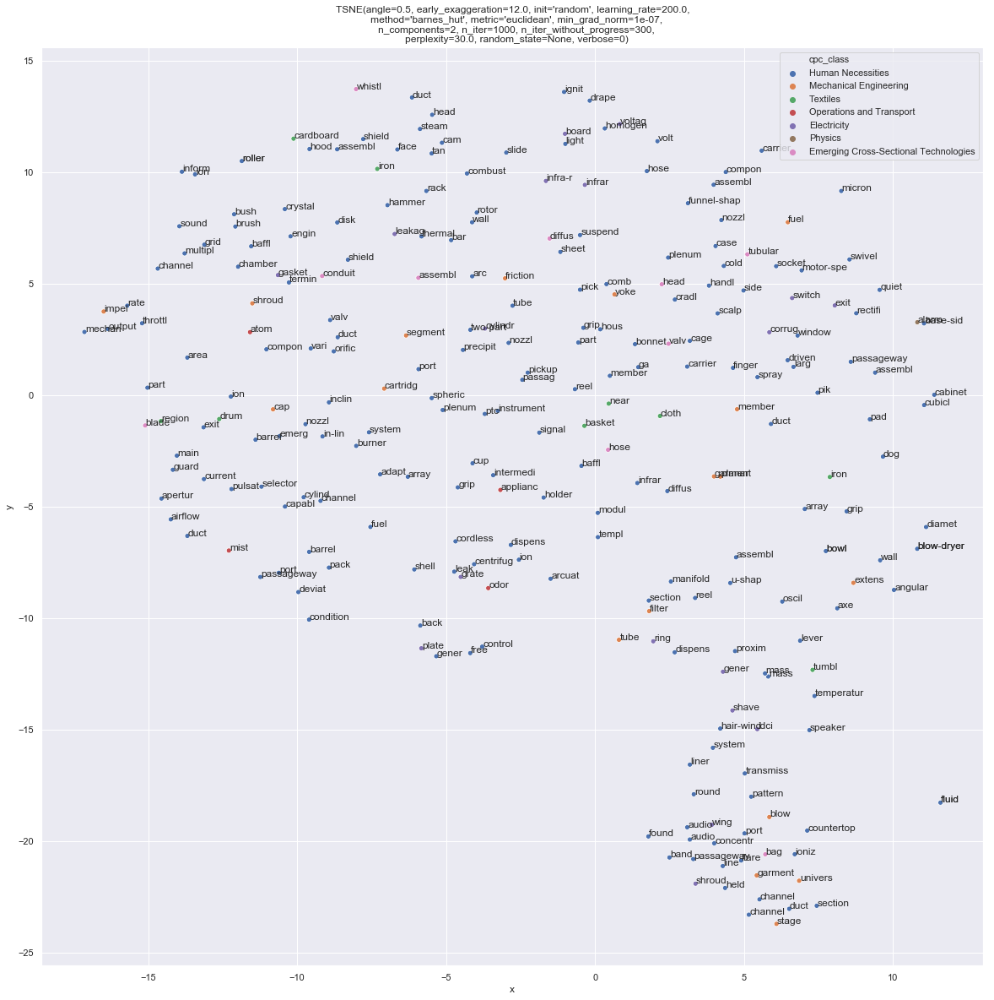

In [24]:
ev64_tsne.plot_embeddings(detailed=True, density=1)

In [25]:
ev300_tsne = EmbeddingVisualizer(tsne, average_word_seed, patents_seed)

Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='euclidean', min_grad_norm=1e-07,
   n_components=2, n_iter=1000, n_iter_without_progress=300,
   perplexity=30.0, random_state=None, verbose=0)
EmbeddingVisualizer initialized


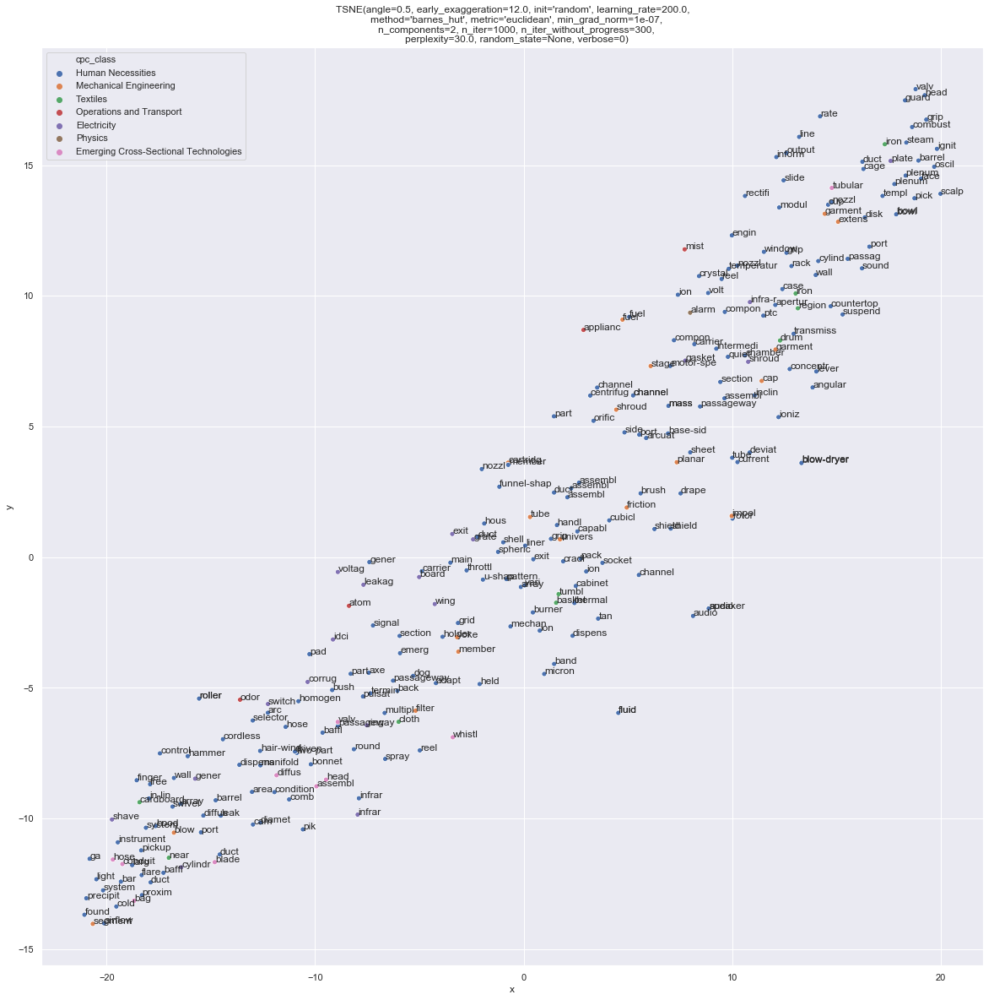

In [26]:
ev300_tsne.plot_embeddings(detailed=True, density=1)

#### Metric MDS

In [27]:
from sklearn.manifold import MDS

mds = MDS()

In [28]:
ev64_mds = EmbeddingVisualizer(mds, final_layer_seed, patents_seed)

Fit  MDS(dissimilarity='euclidean', eps=0.001, max_iter=300, metric=True,
  n_components=2, n_init=4, n_jobs=None, random_state=None, verbose=0)
EmbeddingVisualizer initialized


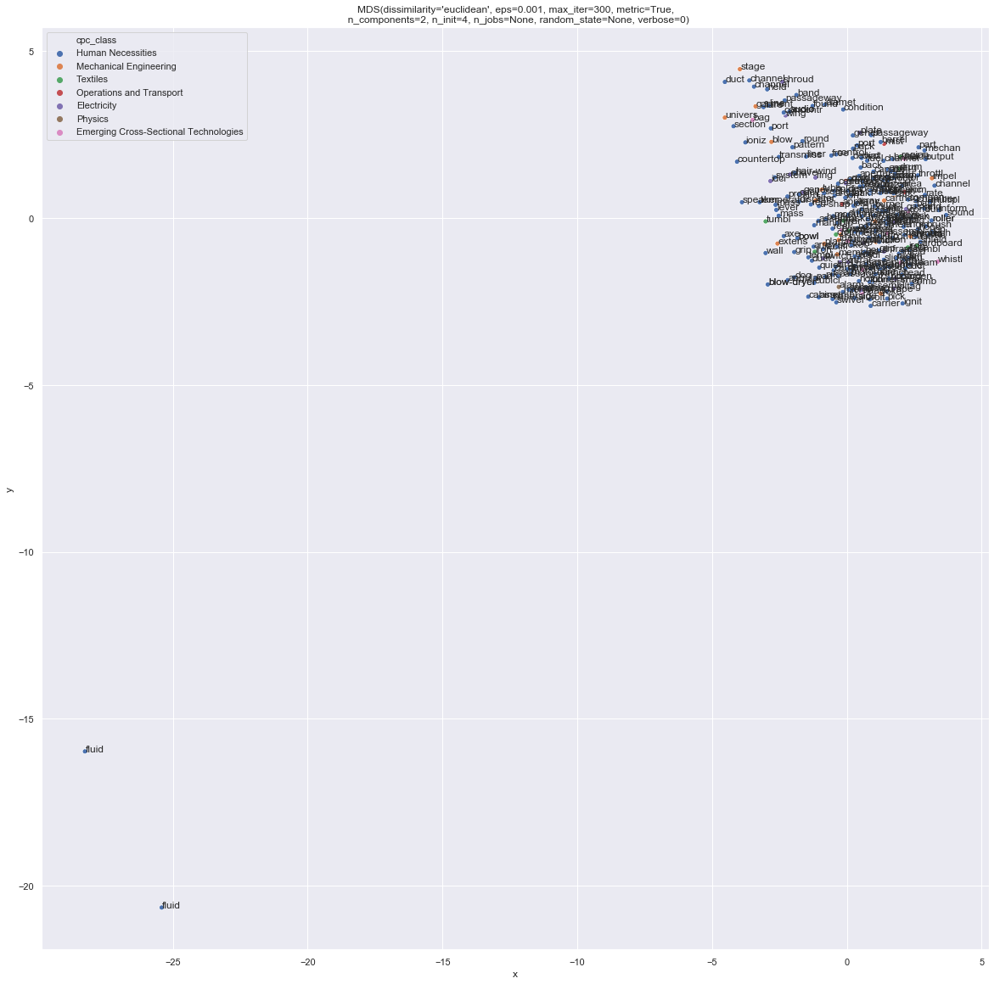

In [29]:
ev64_mds.plot_embeddings(detailed=True, density=1)

In [30]:
ev300_mds = EmbeddingVisualizer(mds, average_word_seed, patents_seed)

Fit  MDS(dissimilarity='euclidean', eps=0.001, max_iter=300, metric=True,
  n_components=2, n_init=4, n_jobs=None, random_state=None, verbose=0)
EmbeddingVisualizer initialized


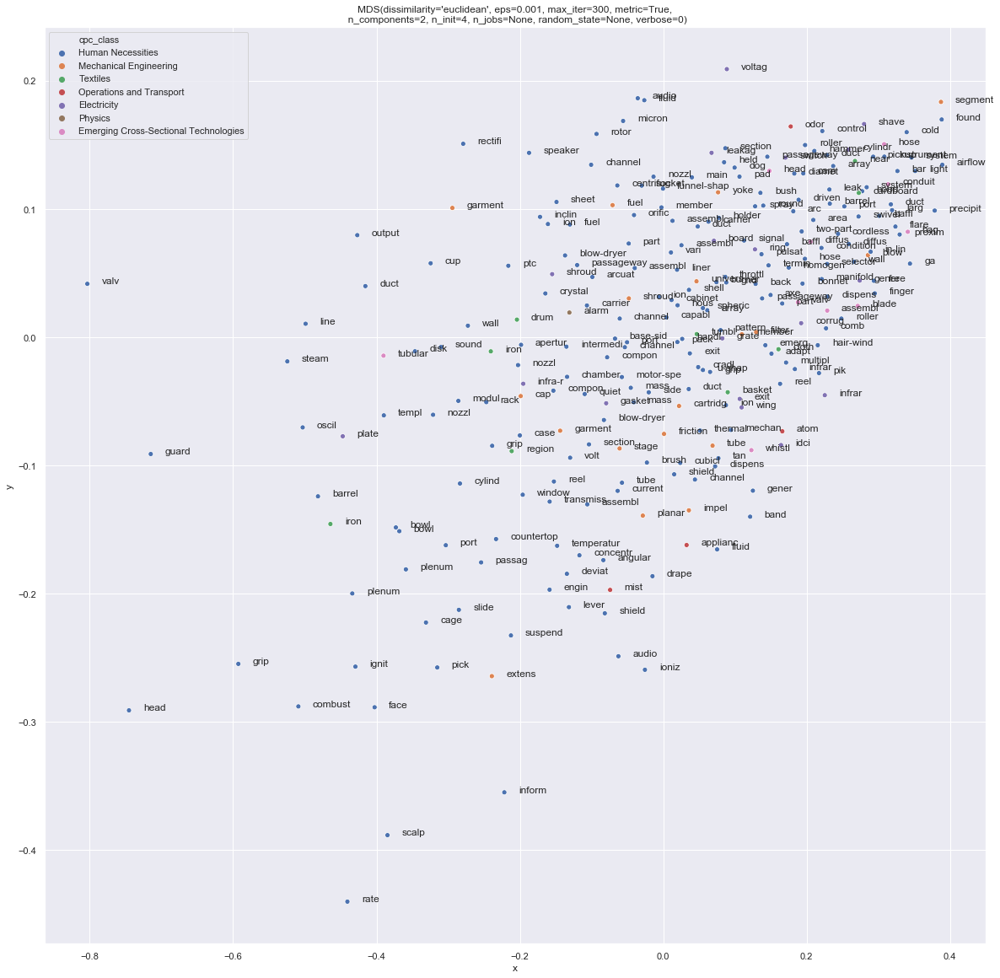

In [31]:
ev300_mds.plot_embeddings(detailed=True, density=1)

#### Non-metric MDS

In [32]:
from sklearn.manifold import MDS

nmds = MDS(metric=False)

In [33]:
ev64_nmds = EmbeddingVisualizer(nmds, final_layer_seed, patents_seed)

Fit  MDS(dissimilarity='euclidean', eps=0.001, max_iter=300, metric=False,
  n_components=2, n_init=4, n_jobs=None, random_state=None, verbose=0)
EmbeddingVisualizer initialized


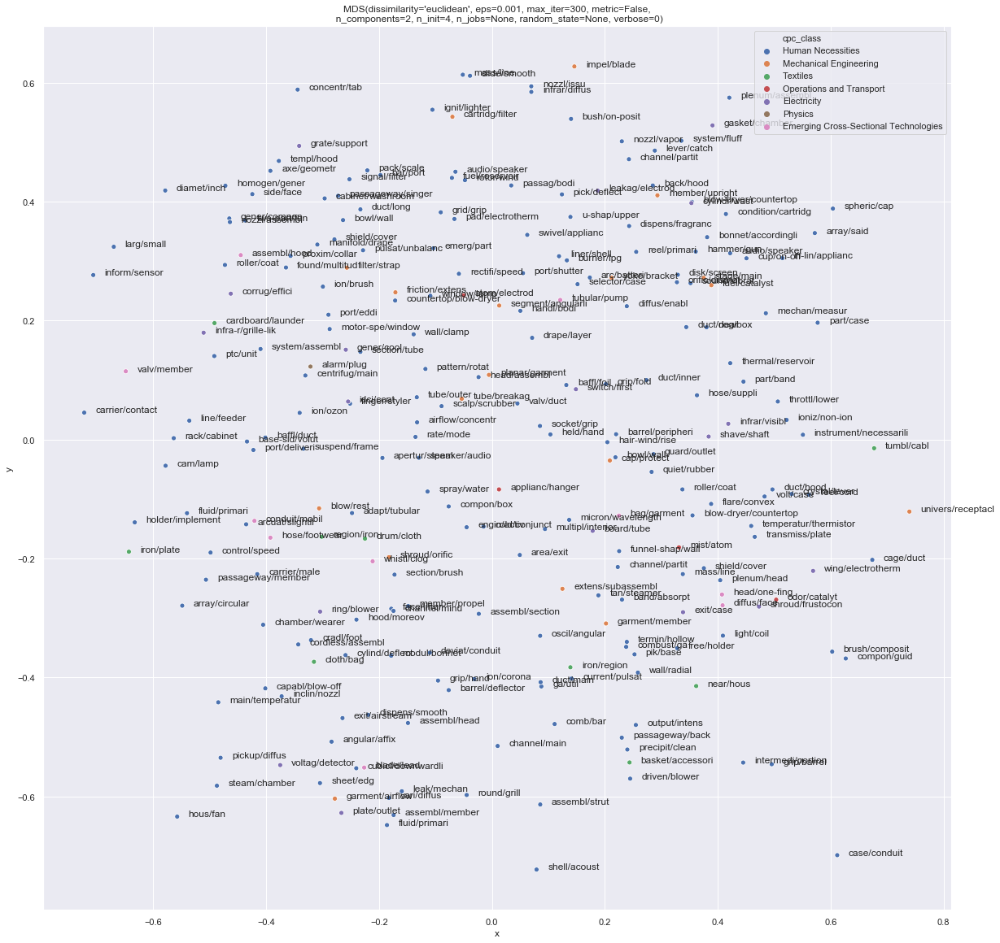

In [34]:
ev64_nmds.plot_embeddings(detailed=True, density=1, terms=2)

In [35]:
ev300_nmds = EmbeddingVisualizer(nmds, average_word_seed, patents_seed)

Fit  MDS(dissimilarity='euclidean', eps=0.001, max_iter=300, metric=False,
  n_components=2, n_init=4, n_jobs=None, random_state=None, verbose=0)
EmbeddingVisualizer initialized


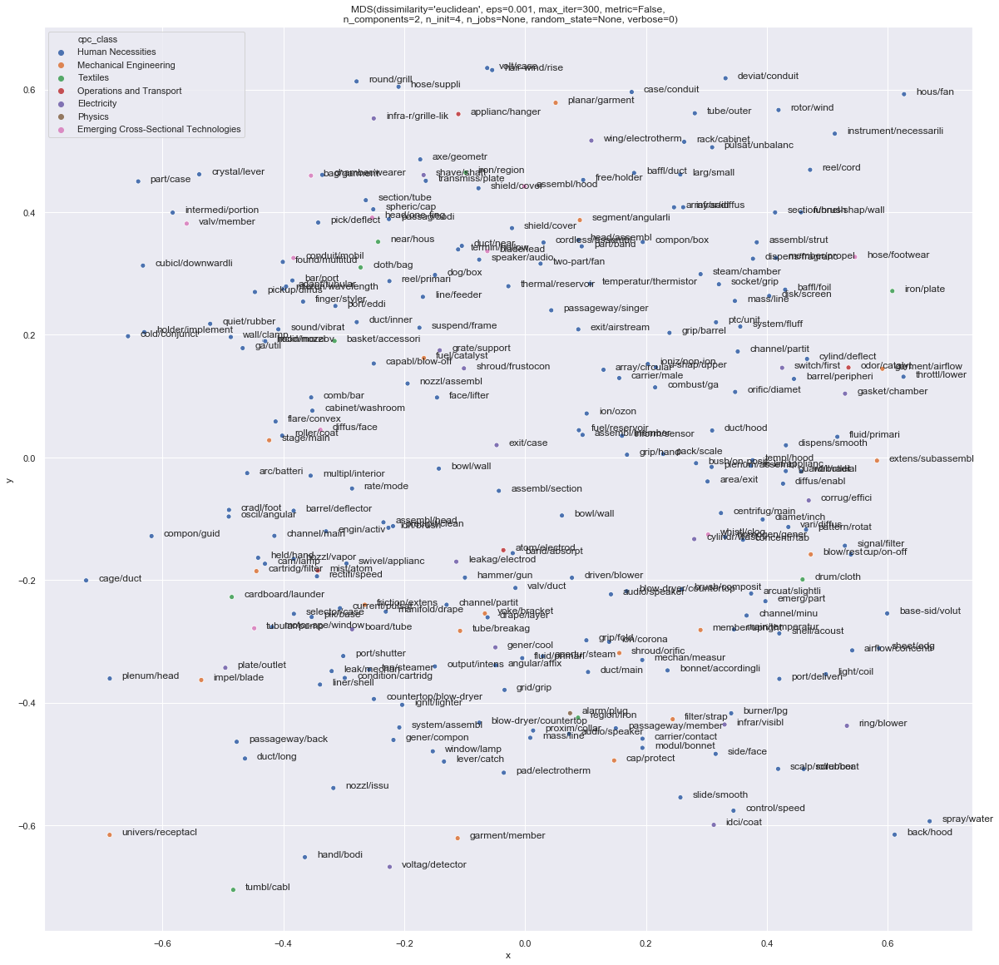

In [36]:
ev300_nmds.plot_embeddings(detailed=True, density=1, terms=2)

#### LocallyLinearEmbedding

In [37]:
from sklearn.manifold import LocallyLinearEmbedding

lle = LocallyLinearEmbedding()

In [38]:
ev64_lle = EmbeddingVisualizer(lle, final_layer_seed, patents_seed)

Fit  LocallyLinearEmbedding(eigen_solver='auto', hessian_tol=0.0001, max_iter=100,
            method='standard', modified_tol=1e-12, n_components=2,
            n_jobs=None, n_neighbors=5, neighbors_algorithm='auto',
            random_state=None, reg=0.001, tol=1e-06)
EmbeddingVisualizer initialized


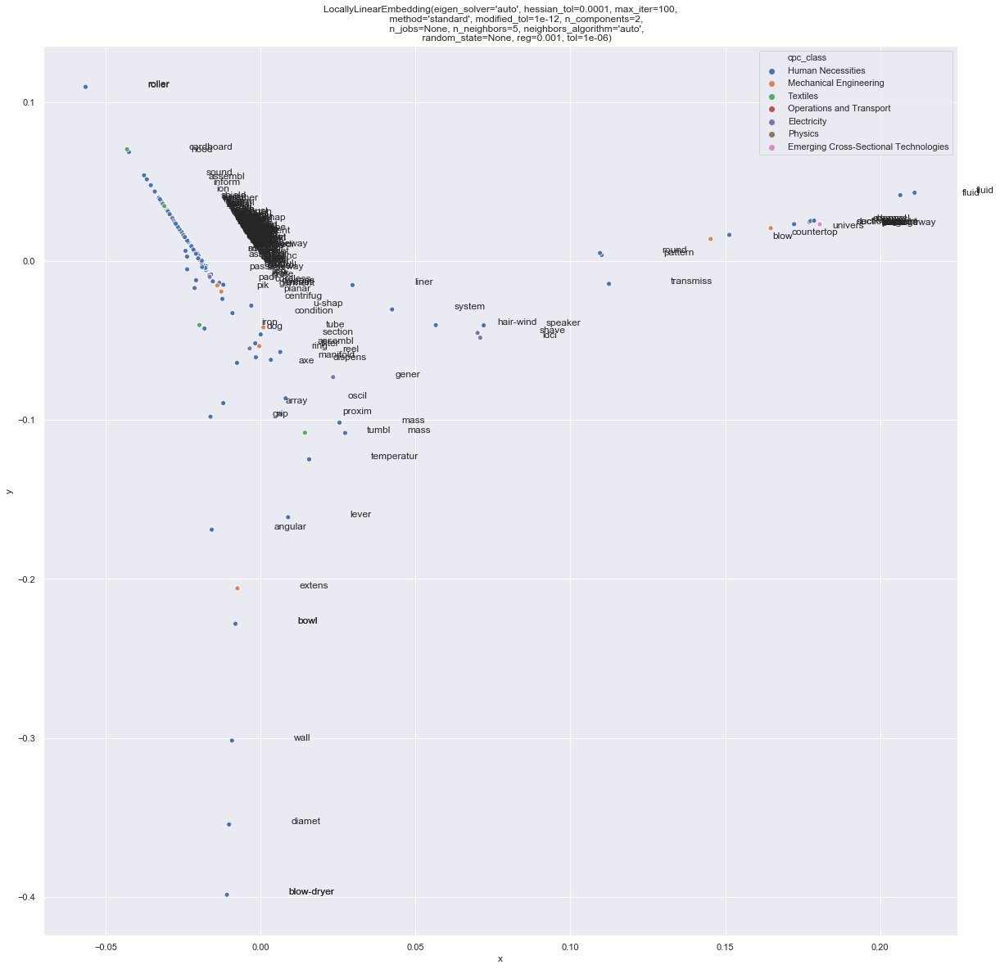

In [39]:
ev64_lle.plot_embeddings(detailed=True, density=1)

In [40]:
ev300_lle = EmbeddingVisualizer(lle, average_word_seed, patents_seed)

Fit  LocallyLinearEmbedding(eigen_solver='auto', hessian_tol=0.0001, max_iter=100,
            method='standard', modified_tol=1e-12, n_components=2,
            n_jobs=None, n_neighbors=5, neighbors_algorithm='auto',
            random_state=None, reg=0.001, tol=1e-06)
EmbeddingVisualizer initialized


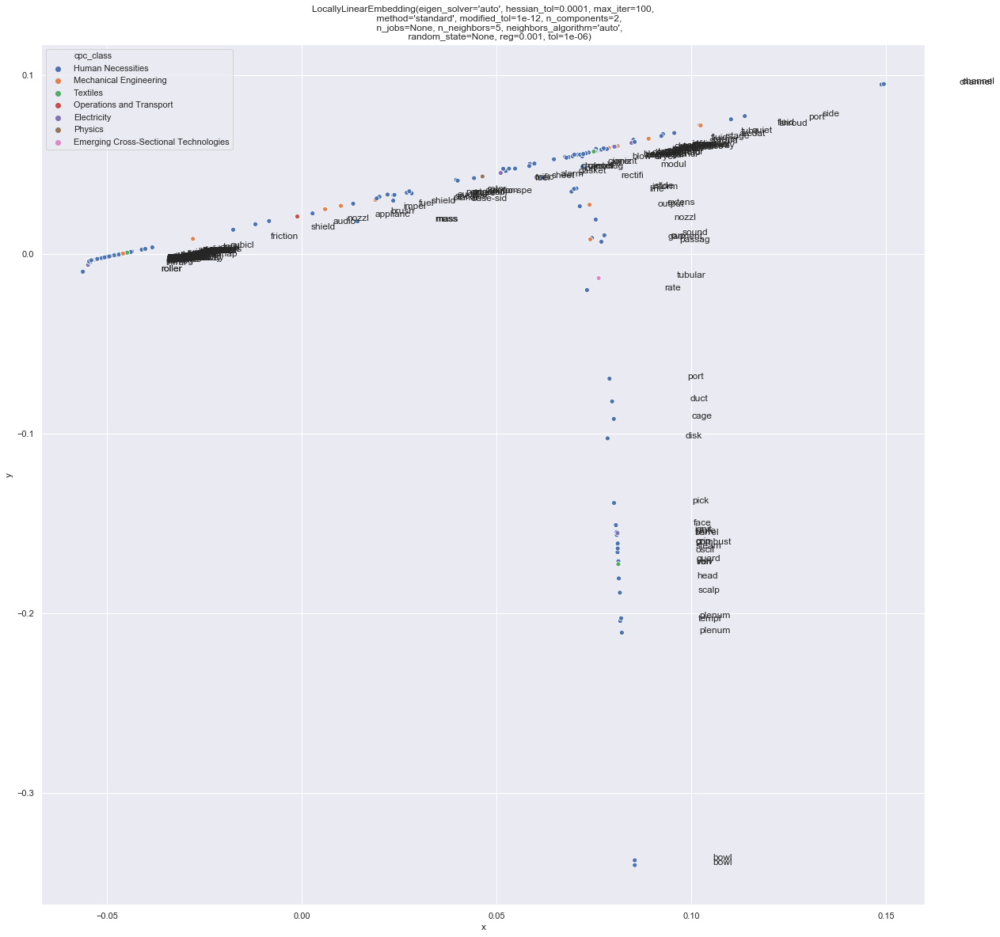

In [41]:
ev300_lle.plot_embeddings(detailed=True, density=1)

#### SpectralEmbedding

In [42]:
from sklearn.manifold import SpectralEmbedding

spectral = SpectralEmbedding()

In [43]:
ev64_spectral = EmbeddingVisualizer(spectral, final_layer_seed, patents_seed)

Fit  SpectralEmbedding(affinity='nearest_neighbors', eigen_solver=None, gamma=None,
         n_components=2, n_jobs=None, n_neighbors=None, random_state=None)
EmbeddingVisualizer initialized


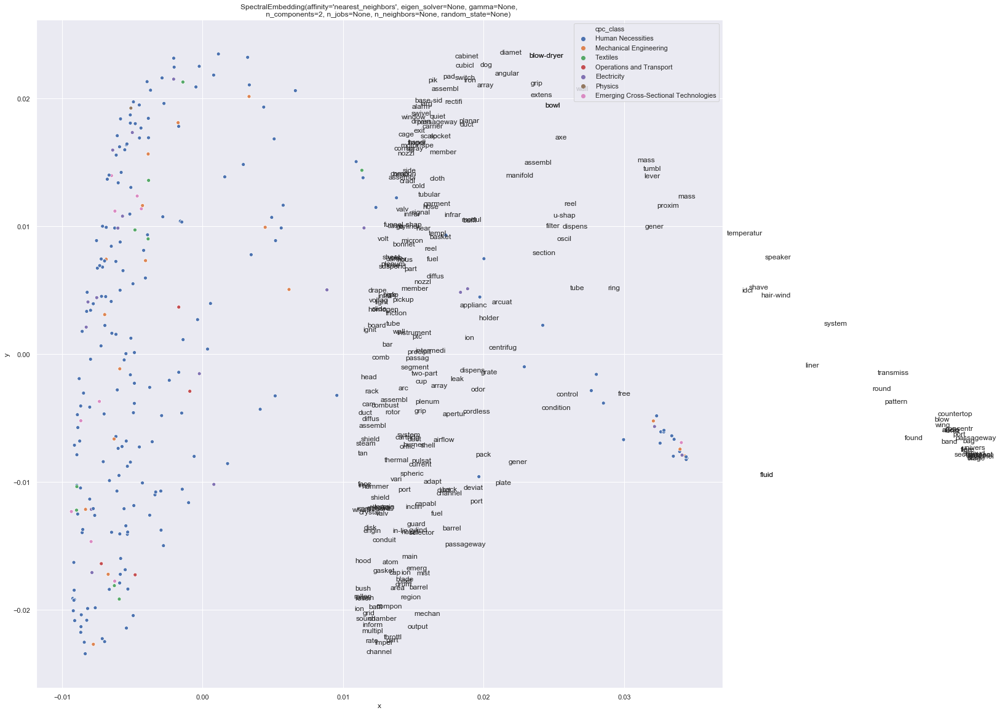

In [44]:
ev64_spectral.plot_embeddings(detailed=True, density=1)

In [45]:
ev300_spectral = EmbeddingVisualizer(spectral, average_word_seed, patents_seed)

Fit  SpectralEmbedding(affinity='nearest_neighbors', eigen_solver=None, gamma=None,
         n_components=2, n_jobs=None, n_neighbors=None, random_state=None)
EmbeddingVisualizer initialized


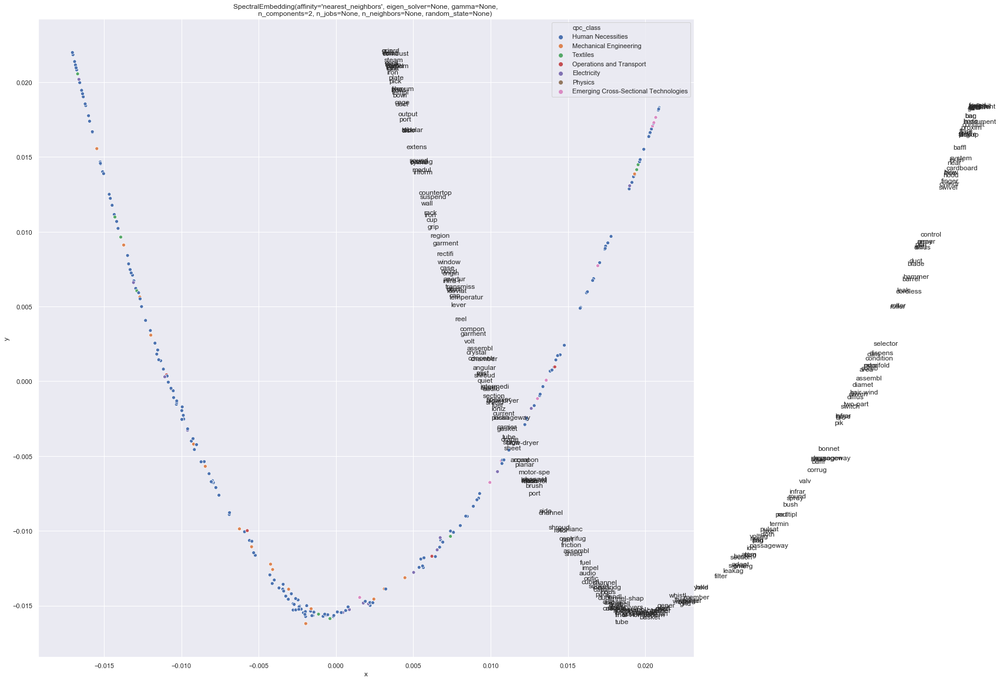

In [46]:
ev300_spectral.plot_embeddings(detailed=True, density=1)

#### Isomap

In [47]:
from sklearn.manifold import Isomap

isomap = Isomap()

In [48]:
ev64_isomap = EmbeddingVisualizer(isomap, final_layer_seed, patents_seed)

Fit  Isomap(eigen_solver='auto', max_iter=None, n_components=2, n_jobs=None,
    n_neighbors=5, neighbors_algorithm='auto', path_method='auto', tol=0)
EmbeddingVisualizer initialized


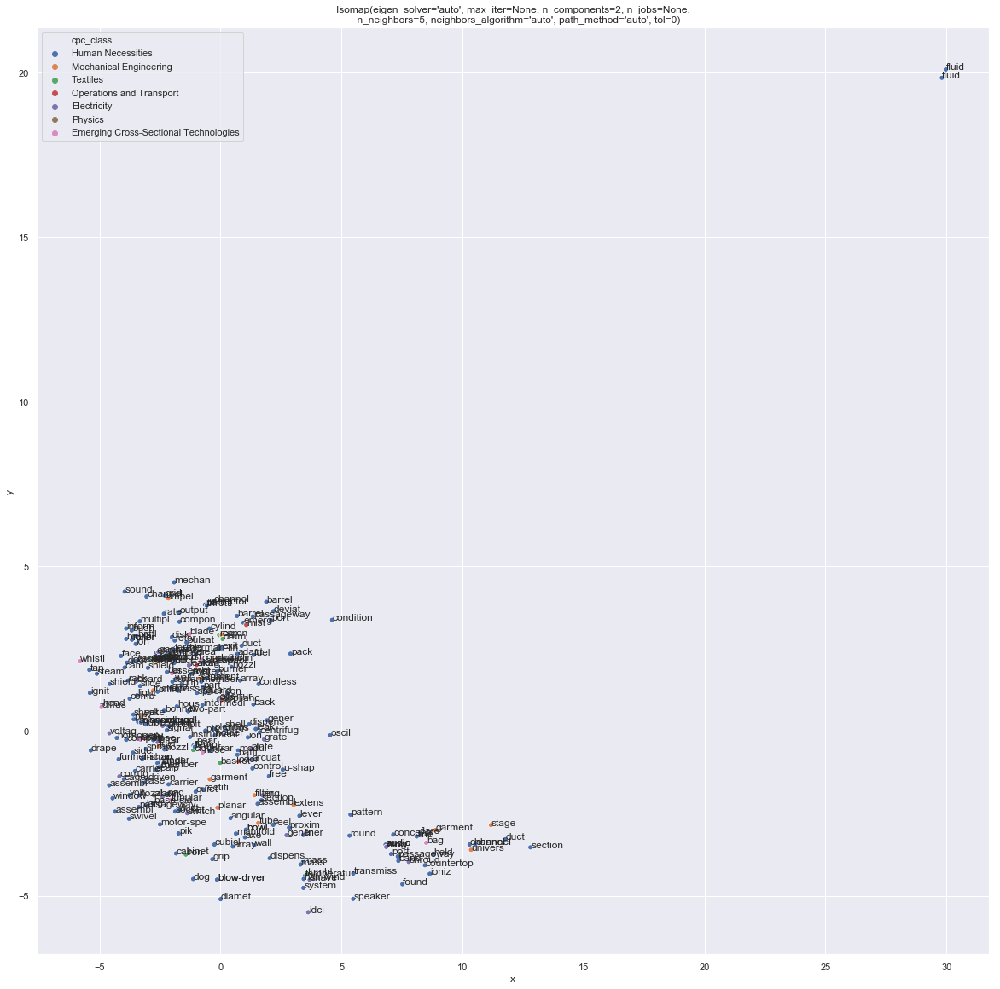

In [49]:
ev64_isomap.plot_embeddings(detailed=True, density=1)

In [50]:
ev300_isomap = EmbeddingVisualizer(isomap, average_word_seed, patents_seed)

Fit  Isomap(eigen_solver='auto', max_iter=None, n_components=2, n_jobs=None,
    n_neighbors=5, neighbors_algorithm='auto', path_method='auto', tol=0)
EmbeddingVisualizer initialized


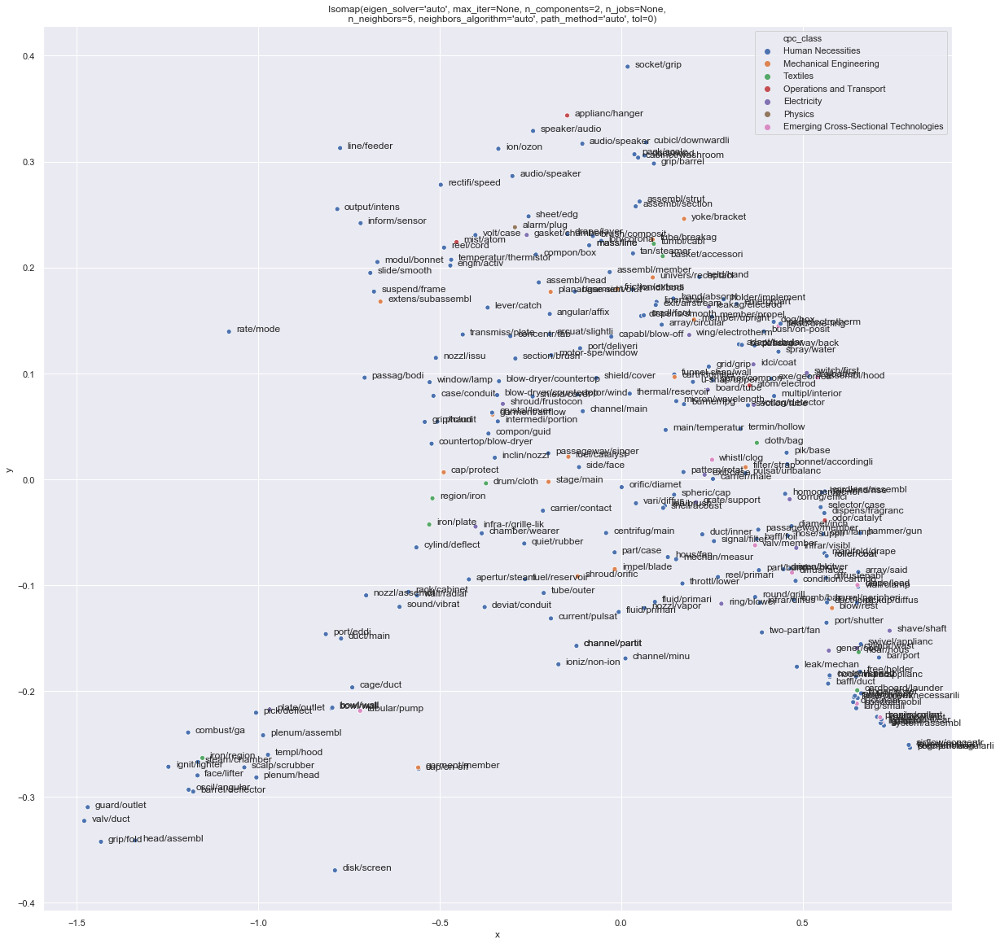

In [51]:
ev300_isomap.plot_embeddings(detailed=True, density=1, terms=2)

#### PCA

In [52]:
from sklearn.decomposition import PCA

pca = PCA()

In [53]:
ev64_pca = EmbeddingVisualizer(pca, final_layer_seed, patents_seed)

Fit  PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)
EmbeddingVisualizer initialized


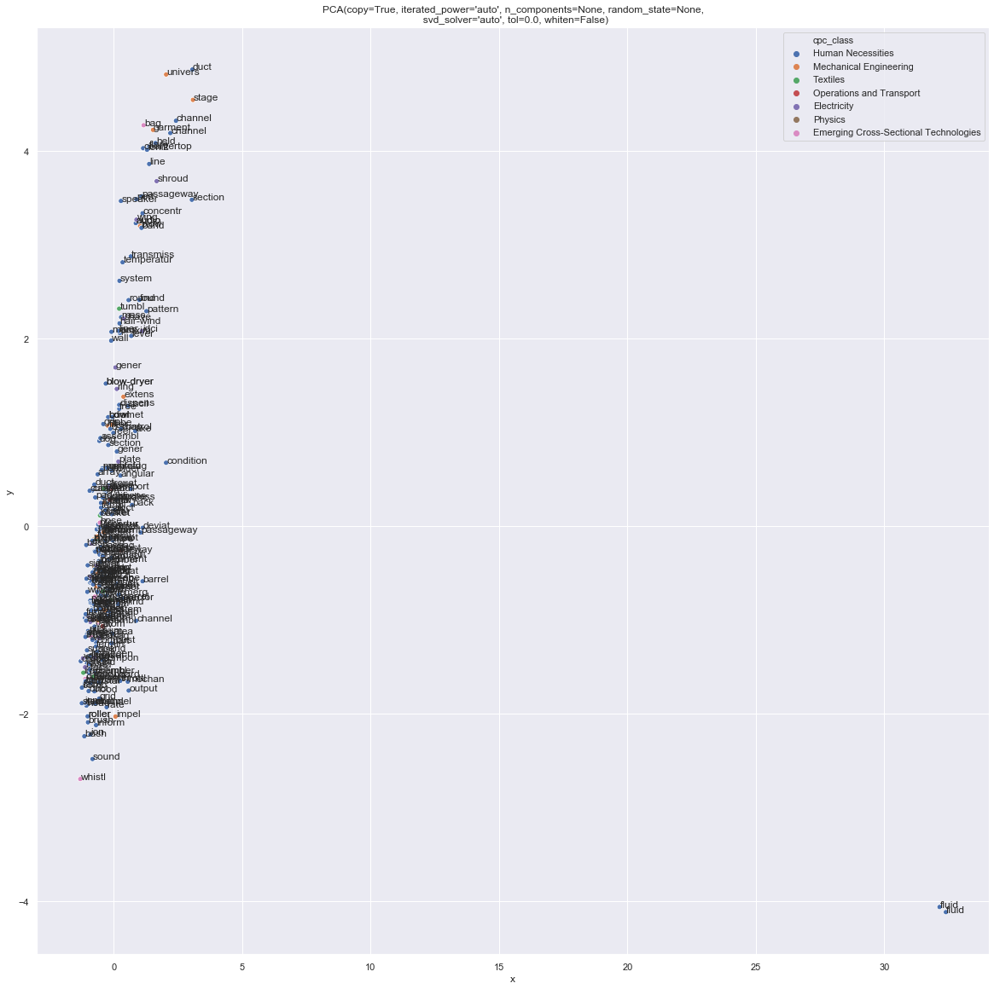

In [54]:
ev64_pca.plot_embeddings(detailed=True, density=1)

In [55]:
ev300_pca = EmbeddingVisualizer(pca, average_word_seed, patents_seed)

Fit  PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)
EmbeddingVisualizer initialized


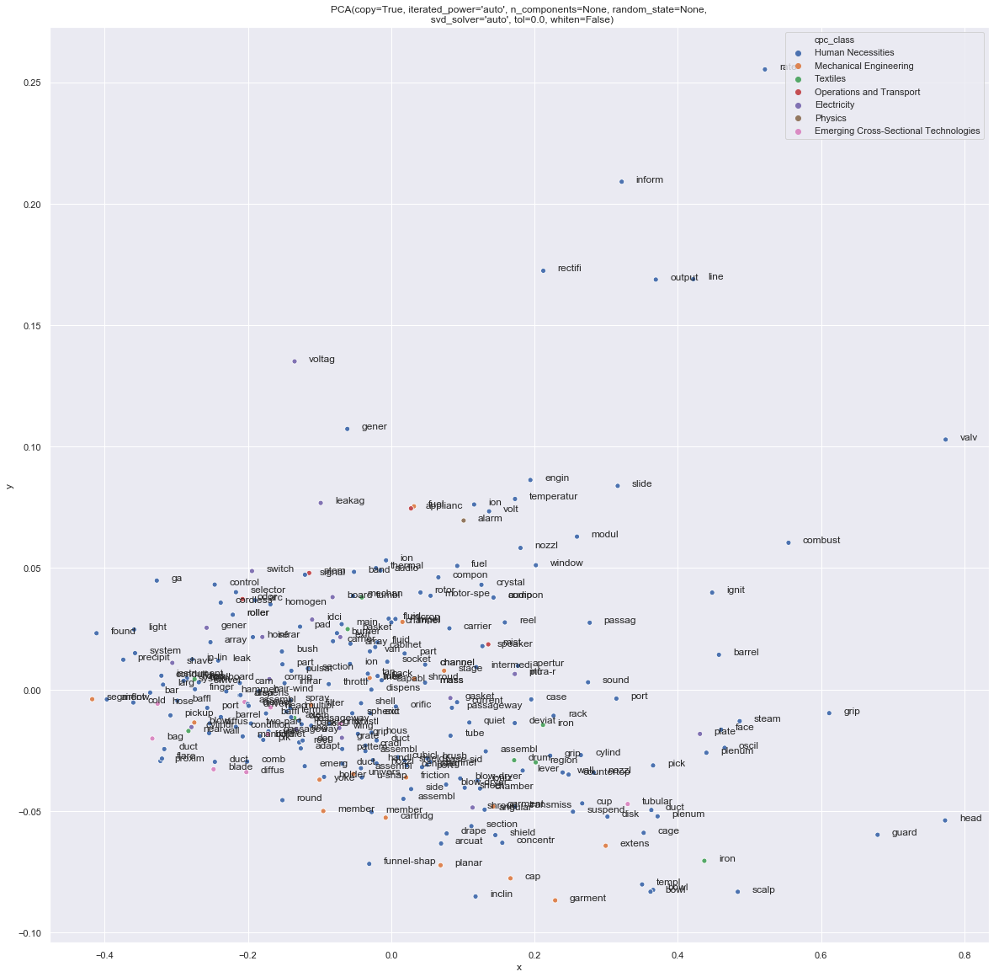

In [56]:
ev300_pca.plot_embeddings(detailed=True, density=1)

#### Cosine Kernel PCA

In [57]:
from sklearn.decomposition import KernelPCA

cosine_pca = KernelPCA(kernel='cosine')

In [58]:
ev64_cosine_pca = EmbeddingVisualizer(cosine_pca, final_layer_seed, patents_seed)

Fit  KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
     fit_inverse_transform=False, gamma=None, kernel='cosine',
     kernel_params=None, max_iter=None, n_components=None, n_jobs=None,
     random_state=None, remove_zero_eig=False, tol=0)
EmbeddingVisualizer initialized


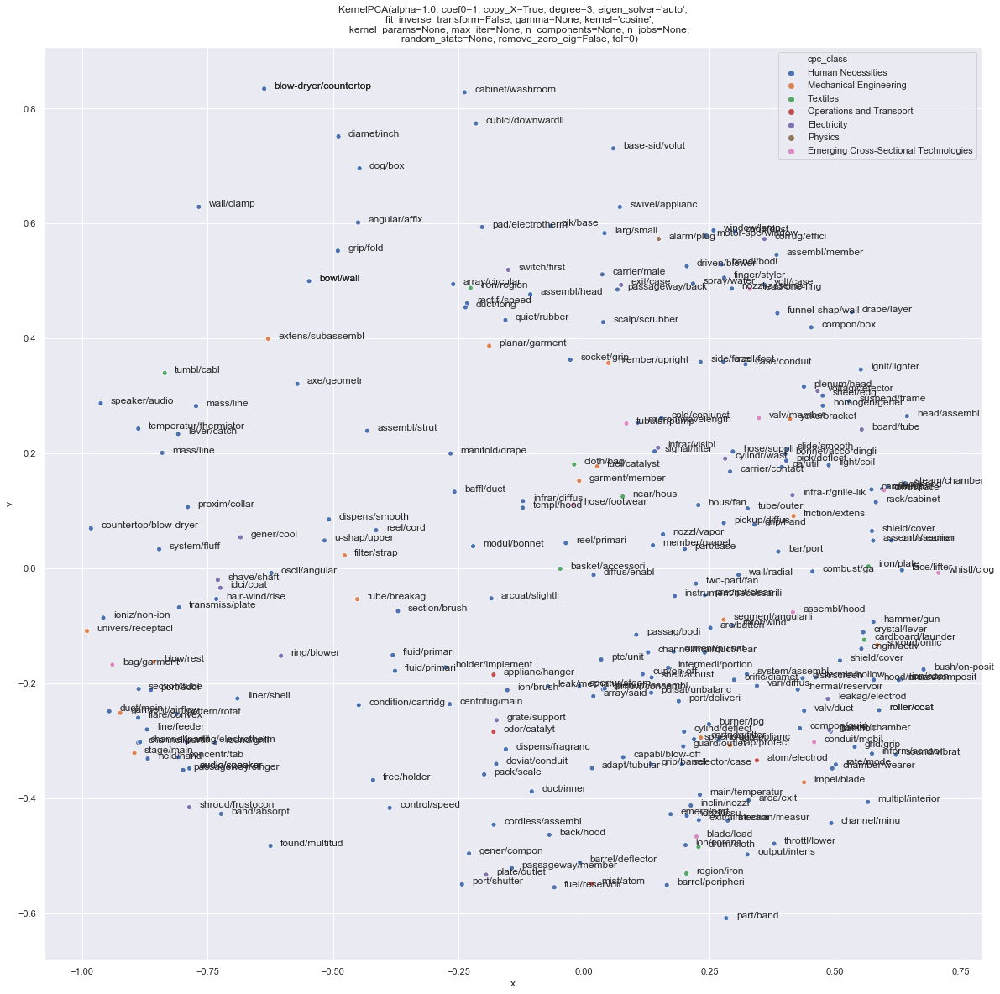

In [59]:
ev64_cosine_pca.plot_embeddings(detailed=True, density=1, terms=2)

In [60]:
ev300_cosine_pca = EmbeddingVisualizer(cosine_pca, average_word_seed, patents_seed)

Fit  KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
     fit_inverse_transform=False, gamma=None, kernel='cosine',
     kernel_params=None, max_iter=None, n_components=None, n_jobs=None,
     random_state=None, remove_zero_eig=False, tol=0)
EmbeddingVisualizer initialized


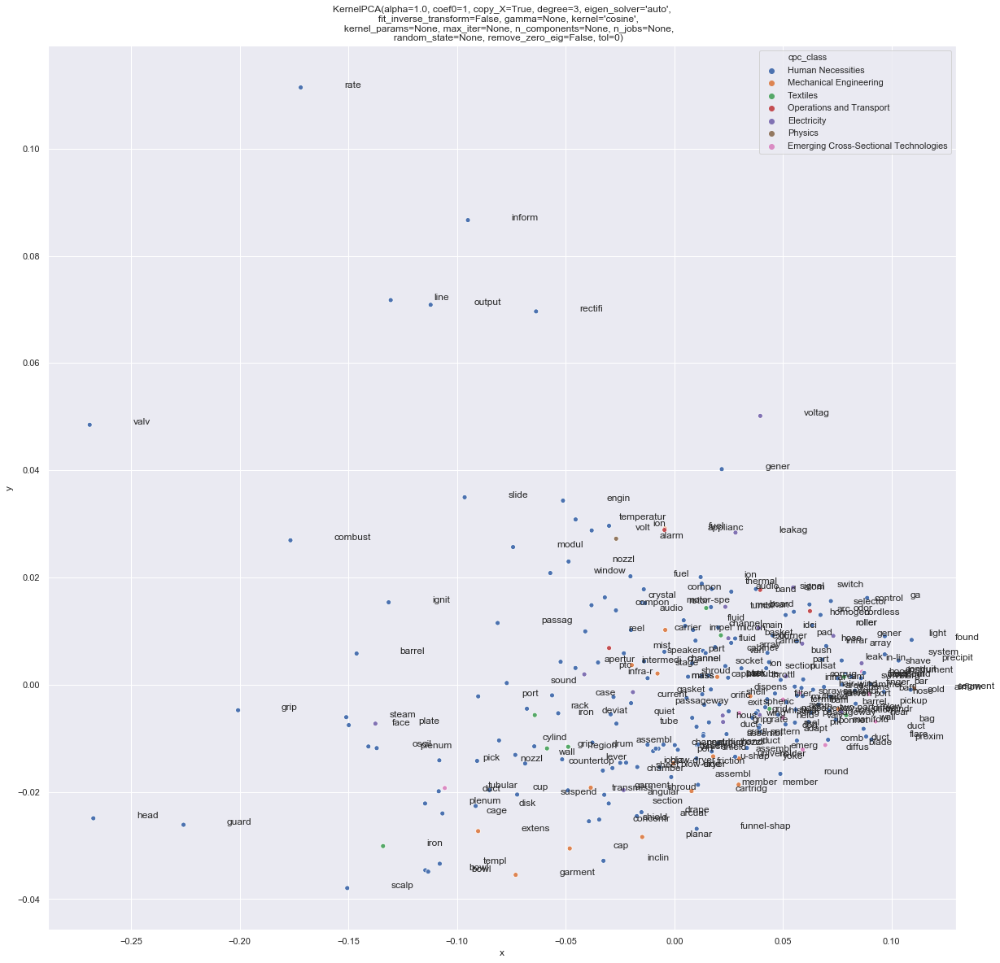

In [61]:
ev300_cosine_pca.plot_embeddings(detailed=True, density=1)

#### Polynomial Kernel PCA

In [62]:
poly_pca = KernelPCA(kernel='poly')

In [63]:
ev64_poly_pca = EmbeddingVisualizer(poly_pca, final_layer_seed, patents_seed)

Fit  KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
     fit_inverse_transform=False, gamma=None, kernel='poly',
     kernel_params=None, max_iter=None, n_components=None, n_jobs=None,
     random_state=None, remove_zero_eig=False, tol=0)
EmbeddingVisualizer initialized


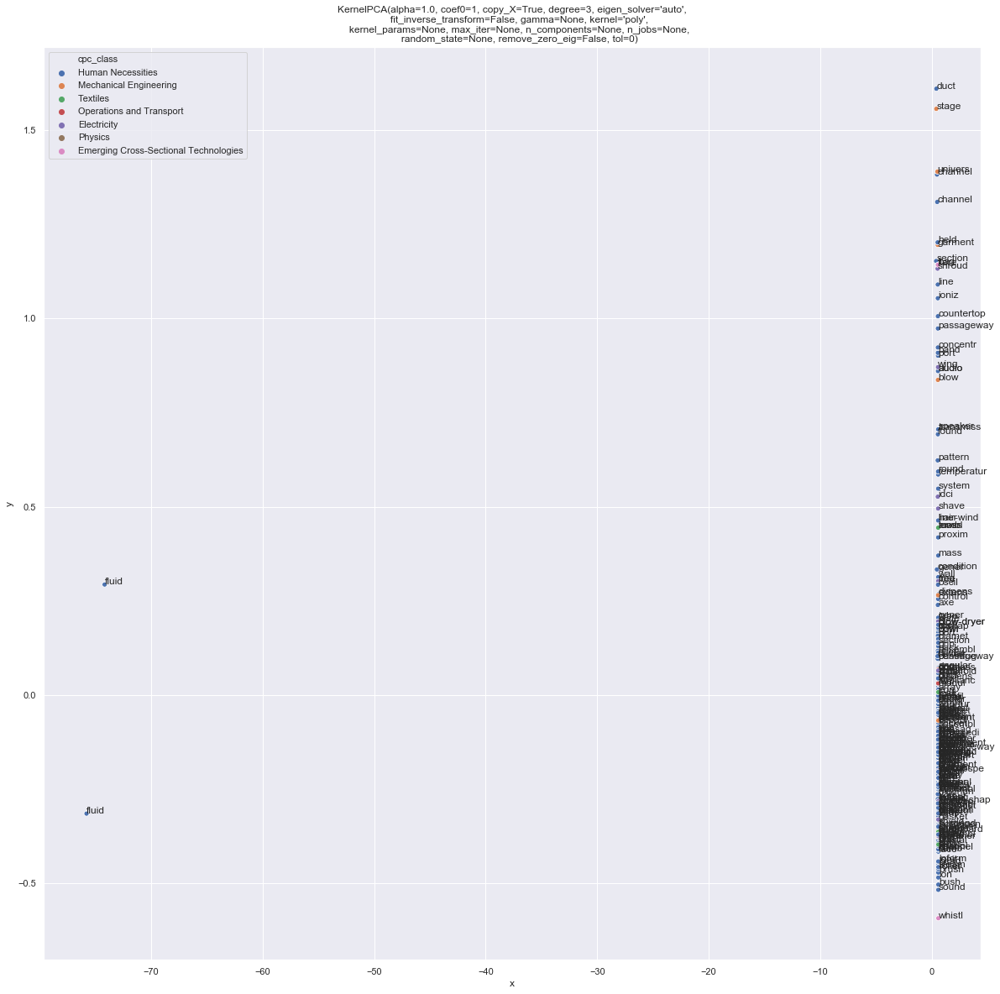

In [64]:
ev64_poly_pca.plot_embeddings(detailed=True, density=1)

In [65]:
ev300_poly_pca = EmbeddingVisualizer(poly_pca, average_word_seed, patents_seed)

Fit  KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
     fit_inverse_transform=False, gamma=None, kernel='poly',
     kernel_params=None, max_iter=None, n_components=None, n_jobs=None,
     random_state=None, remove_zero_eig=False, tol=0)
EmbeddingVisualizer initialized


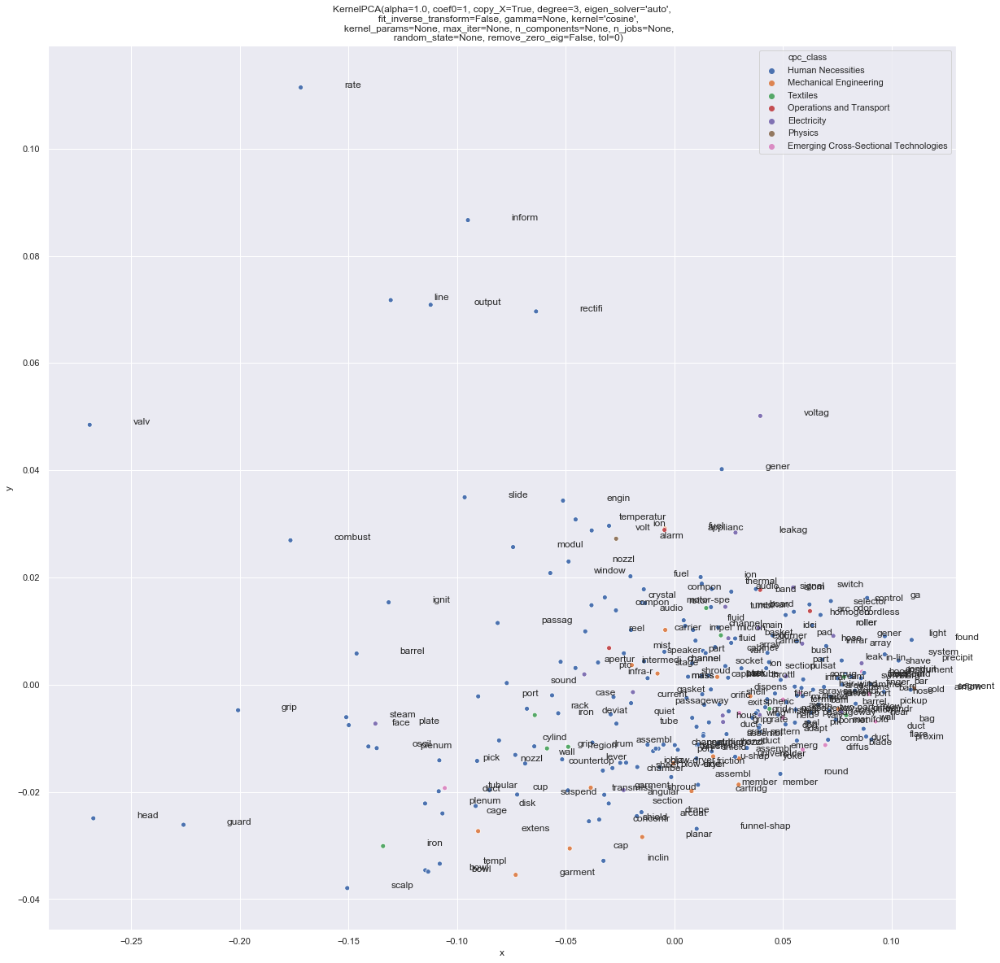

In [66]:
ev300_cosine_pca.plot_embeddings(detailed=True, density=1)

#### SVD

In [67]:
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD()

In [68]:
ev64_svd = EmbeddingVisualizer(svd, final_layer_seed, patents_seed)

Fit  TruncatedSVD(algorithm='randomized', n_components=2, n_iter=5,
       random_state=None, tol=0.0)
EmbeddingVisualizer initialized


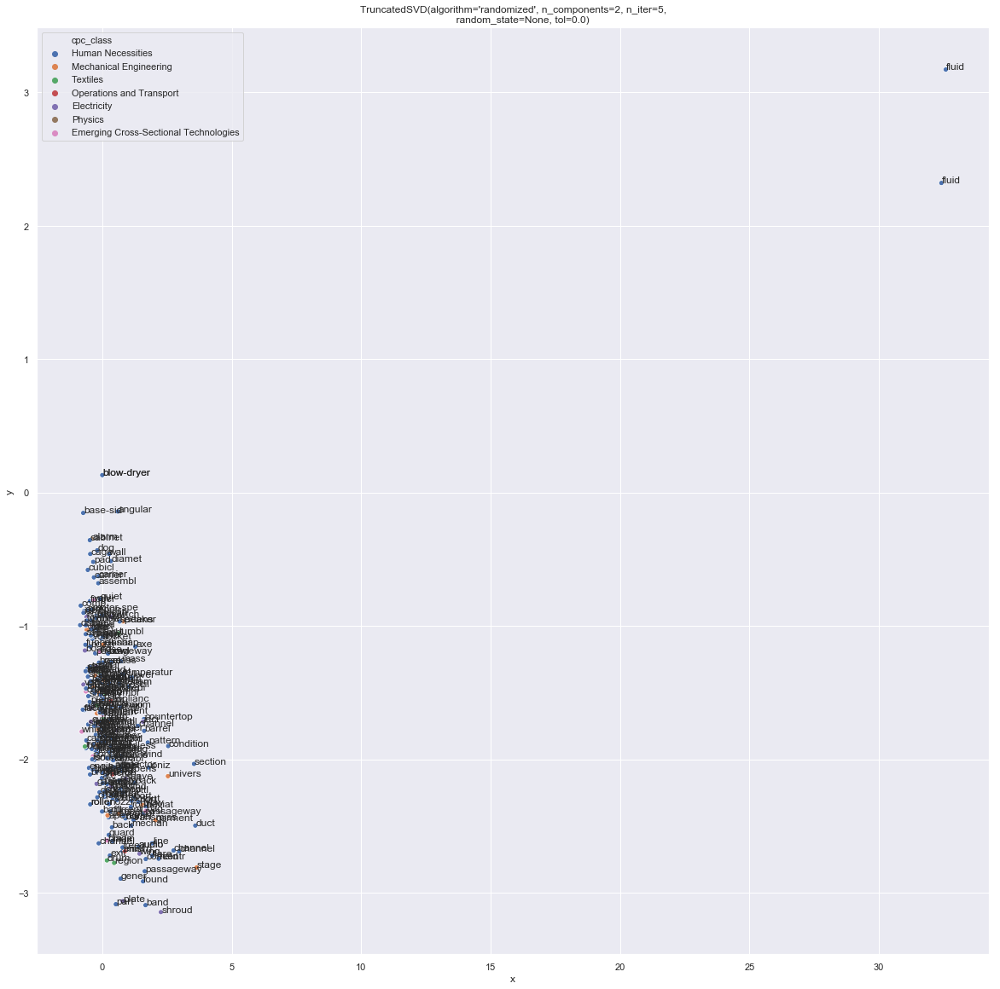

In [69]:
ev64_svd.plot_embeddings(detailed=True, density=1)

In [70]:
ev300_svd = EmbeddingVisualizer(svd, average_word_seed, patents_seed)

Fit  TruncatedSVD(algorithm='randomized', n_components=2, n_iter=5,
       random_state=None, tol=0.0)
EmbeddingVisualizer initialized


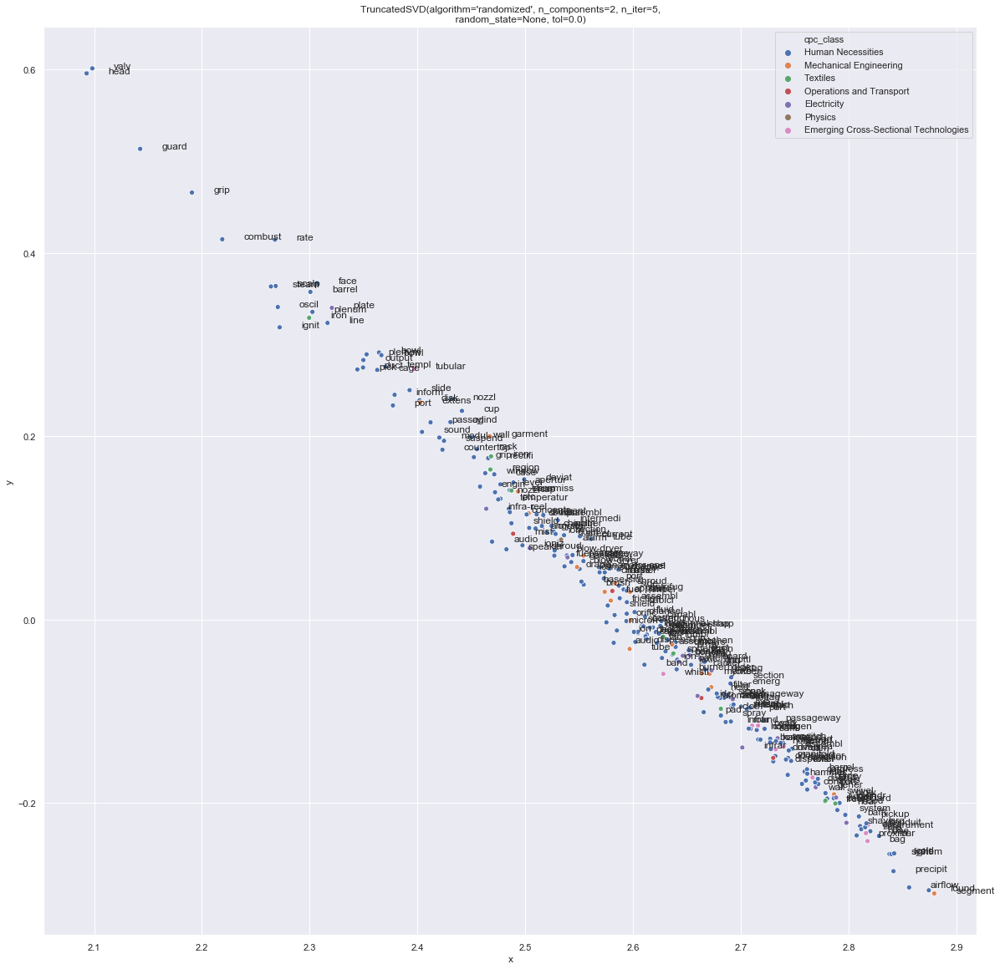

In [71]:
ev300_svd.plot_embeddings(detailed=True, density=1)